In [1]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [2]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Length'] < 200000]
data = data.dropna()#.describe()
data

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


In [3]:
## input for CNVRanger 
#cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
#cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
#cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
#cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)

In [4]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data = data.dropna()#.describe()
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


In [5]:
## Filter by chromosomes
#data_x = distribution[distribution.Chromosome == 'X']
#data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
#data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

#data = data[data['GAUSSIAN-EVAL'] < 0.05]
#data

NameError: name 'data_no_sex_chr' is not defined

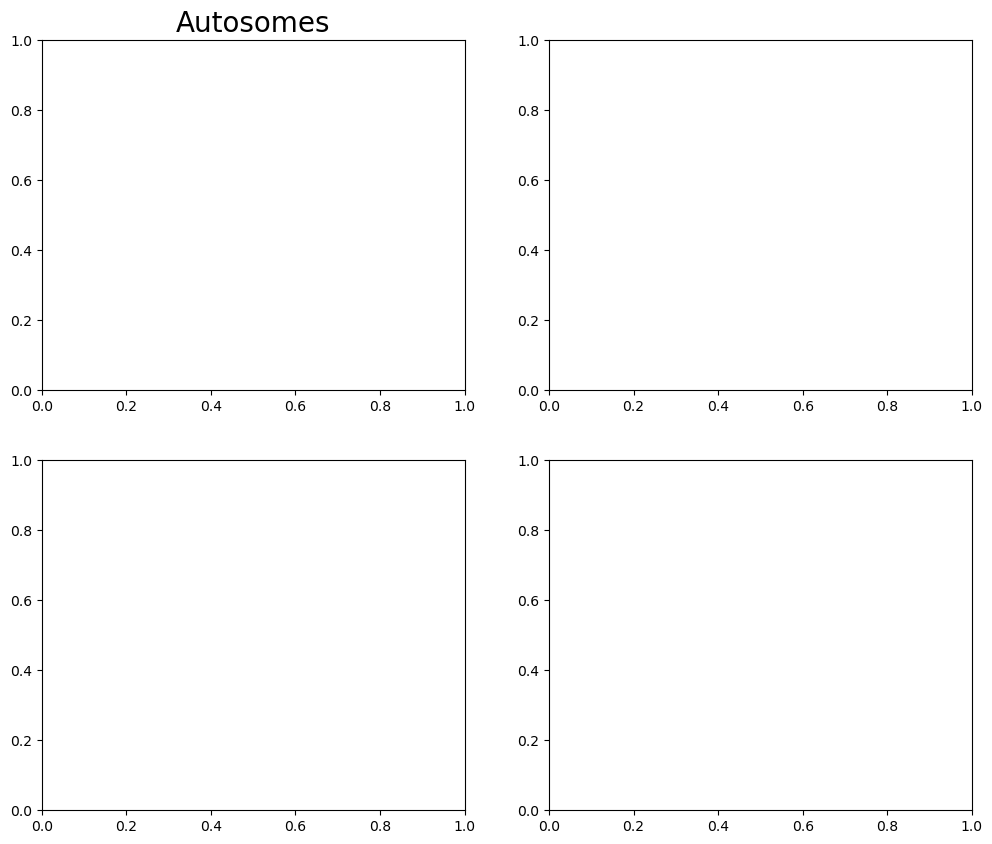

In [6]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

In [7]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv = cnv.fillna(2)
cnv['Chromosome'] = 'chr' + cnv['Chromosome'].astype(str)
cnv['Start'] = cnv['Start'].astype(int)
cnv['End'] = cnv['Start'].astype(int)
#cnv.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv.iloc[:,0:3]
coordinates.to_csv('../data/grch37_cnvr_coordinates.bed', sep='\t', header=False, index=False)
cnv

Sample_ID,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,chr1,176101,176101,2.0,1.0,1.0,1.0,1.25,1.0,1.0,...,1.0,0.25,1.0,0.500000,1.000000,2.0,0.666667,1.0,1.0,1.0
1,chr1,449901,449901,0.0,0.5,0.0,0.0,0.00,0.0,0.0,...,0.0,0.00,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0
2,chr1,665601,665601,1.0,2.0,2.0,2.0,2.00,2.0,2.0,...,1.5,1.25,2.0,1.333333,1.666667,1.5,1.500000,2.0,2.0,2.0
3,chr1,891701,891701,2.0,2.0,2.0,2.0,2.00,2.0,2.0,...,0.0,0.00,2.0,2.000000,2.000000,0.0,2.000000,0.0,0.0,0.0
4,chr1,1007801,1007801,0.0,2.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.00,0.0,0.000000,0.000000,0.0,1.000000,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,chr9,140136301,140136301,2.0,2.0,2.0,2.0,2.00,2.0,2.0,...,1.0,2.00,2.0,2.000000,2.000000,2.0,2.000000,2.0,2.0,2.0
7776,chr9,140197201,140197201,2.0,2.0,2.0,2.0,2.00,2.0,2.0,...,1.0,2.00,2.0,2.000000,2.000000,2.0,2.000000,2.0,2.0,2.0
7777,chr9,140245301,140245301,0.0,0.0,0.0,0.0,0.00,2.0,0.0,...,1.0,0.00,2.0,0.000000,0.000000,0.0,2.000000,2.0,0.0,0.0
7778,chr9,140387601,140387601,2.0,2.0,2.0,2.0,2.00,2.0,2.0,...,1.0,2.00,2.0,2.000000,2.000000,2.0,2.000000,2.0,2.0,2.0


In [8]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,1.000000,0.5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A04,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A05,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A06,1.250000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A08,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.000000,0.0,1.5,0.0,0.0,0.0,2.0,2.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
SS6004477,0.666667,0.0,1.5,2.0,1.0,0.0,2.0,1.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,1.000000,0.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0


In [9]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
LP6005443-DNA_B06,F,WestEurasia,Iceland,0.500000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,1.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,1.000000,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,1.250000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_G11,M,Africa,SierraLeone,1.333333,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,1.000000,0.0,1.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_A06,M,EastAsia,Myanmar,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_B06,M,EastAsia,Myanmar,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0
LP6005441-DNA_B08,F,Africa,Congo,1.000000,0.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [10]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [11]:

dt_groupped

[                  7-Gender    10-Region      11-Country         0    1    2  \
 LP6005443-DNA_B06        F  WestEurasia         Iceland  0.500000  0.0  2.0   
 LP6005442-DNA_D08        F  WestEurasia         Iceland  1.333333  0.0  2.0   
 LP6005442-DNA_C02        M  WestEurasia        Abkhazia  1.000000  0.0  2.0   
 LP6005442-DNA_D02        M  WestEurasia          Russia  1.000000  0.0  1.0   
 LP6005442-DNA_F04        M  WestEurasia          Jordan  0.500000  0.0  2.0   
 ...                    ...          ...             ...       ...  ...  ...   
 LP6005443-DNA_A06        M  WestEurasia          Greece  0.500000  0.0  2.0   
 LP6005441-DNA_H12        F  WestEurasia  Italy(Tuscany)  1.000000  0.0  2.0   
 LP6005441-DNA_G10        M  WestEurasia          Russia  1.000000  0.0  2.0   
 LP6005441-DNA_H10        F  WestEurasia          Russia  1.000000  0.0  1.0   
 LP6005592-DNA_G01        M  WestEurasia           Yemen  1.000000  0.0  2.0   
 
                      3    4    5    6

In [51]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


/Users/luciabazan/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3745: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3745: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var 

,0,1,2,3,4,5,6,7,8,9,...,7770,7771,7772,7773,7774,7775,7776,7777,7778,7779
WestEurasia-SouthAsia,0.008951,0.021117,0.008930,0.028539,0.009192,0.017075,0.013699,NaN,0.010758,0.018555,...,0.022394,0.020612,NaN,0.013699,0.023501,0.014306,NaN,0.012835,0.018555,0.018555
WestEurasia-Africa,0.008789,0.013699,0.013018,0.009288,0.013865,0.021128,0.013699,0.022727,0.013699,0.018940,...,0.013294,0.010016,0.022727,0.009676,0.008655,0.017850,0.022727,0.181449,0.027678,0.008750
WestEurasia-CentralAsiaSiberia,0.025212,0.024486,0.047610,0.011286,0.024807,0.013423,0.013699,NaN,0.013699,0.017473,...,0.020462,0.047310,NaN,0.013699,0.021325,0.016111,NaN,0.011836,0.017473,0.017473
WestEurasia-Oceania,0.013838,0.017448,0.010445,0.012896,0.011436,0.018085,0.013699,0.041667,0.017448,0.017159,...,0.010624,0.026344,NaN,0.013699,0.010311,0.014829,NaN,0.012459,0.017159,0.017159
WestEurasia-America,0.036415,0.013699,0.012277,0.014408,0.046694,0.011823,0.013699,NaN,0.013699,0.016939,...,0.023830,0.021192,NaN,0.013699,0.010609,0.030630,NaN,0.011726,0.022097,0.016939
WestEurasia-EastAsia,0.008742,0.009323,0.009007,0.008865,0.008408,0.009550,0.013699,NaN,0.013699,0.019084,...,0.009794,0.020547,NaN,0.013699,0.011116,0.010372,0.021739,0.034592,0.019084,0.019084
SouthAsia-Africa,0.012566,0.039569,0.016973,0.044886,0.015571,0.051116,NaN,0.022727,0.025641,NaN,...,0.044333,0.017710,0.022727,0.022727,0.033670,0.043562,0.022727,0.215497,0.042370,0.022727
SouthAsia-CentralAsiaSiberia,0.038874,0.016569,0.066501,0.059606,0.030303,0.016204,NaN,NaN,0.025641,NaN,...,NaN,0.027315,NaN,NaN,NaN,0.039095,NaN,0.027890,NaN,NaN
SouthAsia-Oceania,0.020080,0.016346,0.016013,0.068306,0.016338,0.054406,NaN,0.041667,0.017812,NaN,...,0.041667,0.017083,NaN,NaN,0.041667,0.036044,NaN,0.016004,NaN,NaN
SouthAsia-America,0.055461,0.035202,0.018683,0.075501,0.062369,0.037055,NaN,NaN,0.025641,NaN,...,0.075501,0.016492,NaN,NaN,0.045455,0.065934,NaN,0.016983,0.045455,NaN


In [52]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,28,29,43,66,91,169,170,171,202,211,...,7723,7725,7731,7752,7753,7758,7762,7765,7766,7777
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,False,True,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,True,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,False,True,True,True,False,True,...,False,False,False,False,True,False,True,False,False,False


In [53]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['Chromosome'])
vst_dt.insert (1, 'start', cnv['Start'])
vst_dt.insert (2, 'end', cnv['End'])
#vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,chr1,176101,176101,0.00895,0.00879,0.02521,0.01384,0.03641,0.00874,0.01257,...,0.03099,0.02162,0.04594,0.01256,0.05774,0.02413,0.04194,0.07434,0.01704,0.05870
1,chr1,449901,449901,0.02112,0.01370,0.02449,0.01745,0.01370,0.00932,0.03957,...,0.03704,0.04167,0.00000,0.02174,0.02232,0.03704,0.02312,0.04167,0.01746,0.02174
2,chr1,665601,665601,0.00893,0.01302,0.04761,0.01045,0.01228,0.00901,0.01697,...,0.03579,0.02098,0.01540,0.01903,0.08638,0.04777,0.06274,0.02541,0.01442,0.01878
3,chr1,891701,891701,0.02854,0.00929,0.01129,0.01290,0.01441,0.00886,0.04489,...,0.01421,0.01546,0.01677,0.01115,0.01990,0.02132,0.01398,0.02192,0.01538,0.01680
4,chr1,1007801,1007801,0.00919,0.01387,0.02481,0.01144,0.04669,0.00841,0.01557,...,0.01850,0.01603,0.04168,0.01659,0.03143,0.03434,0.03144,0.07107,0.01552,0.06172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7775,chr9,140136301,140136301,0.01431,0.01785,0.01611,0.01483,0.03063,0.01037,0.04356,...,0.01415,0.01511,0.02896,0.03252,0.01975,0.03704,0.02935,0.04167,0.02702,0.05210
7776,chr9,140197201,140197201,0.00000,0.02273,0.00000,0.00000,0.00000,0.02174,0.02273,...,0.02273,0.02273,0.02273,0.01112,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
7777,chr9,140245301,140245301,0.01284,0.18145,0.01184,0.01246,0.01173,0.03459,0.21550,...,0.13294,0.18085,0.16868,0.29705,0.02949,0.02780,0.06612,0.02192,0.03113,0.03520
7778,chr9,140387601,140387601,0.01856,0.02768,0.01747,0.01716,0.02210,0.01908,0.04237,...,0.03872,0.03759,0.01576,0.04404,0.00000,0.04545,0.00000,0.04545,0.00000,0.04545


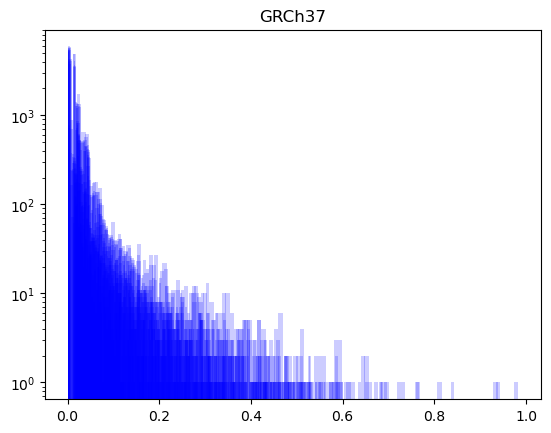

In [59]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")
    plt.title('GRCh37')

In [55]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia


In [56]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location#[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
28,chr1,8360201,8360201,0.00000,0.00000,0.24275,0.00000,0.39679,0.00000,0.00000,...,0.21811,0.00000,0.36688,0.00000,0.18174,0.04652,0.22051,0.31818,0.00000,0.36991
29,chr1,9846201,9846201,0.07934,0.01894,0.02107,0.01156,0.26108,0.03647,0.11471,...,0.06065,0.04167,0.32616,0.06675,0.02424,0.17665,0.01688,0.21544,0.02702,0.13372
43,chr1,16150401,16150401,0.00908,0.09647,0.14614,0.03920,0.03730,0.13347,0.11400,...,0.02901,0.23709,0.02787,0.01512,0.38022,0.07994,0.01761,0.17174,0.29115,0.04471
66,chr1,24377601,24377601,0.01836,0.16983,0.03169,0.13719,0.13446,0.01801,0.14586,...,0.11813,0.65554,0.02273,0.28063,0.33654,0.13178,0.07743,0.65278,0.10418,0.24008
91,chr1,33193801,33193801,0.01667,0.02970,0.02526,0.02430,0.09932,0.00886,0.06848,...,0.00000,0.00000,0.21212,0.04373,0.00000,0.18816,0.03851,0.18182,0.03731,0.09557
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7758,chr9,131183401,131183401,0.05058,0.21085,0.05822,0.27048,0.11034,0.25829,0.08441,...,0.07310,0.01716,0.03814,0.01577,0.11414,0.03030,0.10177,0.06667,0.01453,0.05794
7762,chr9,134074401,134074401,0.00895,0.01012,0.01001,0.05698,0.18511,0.00874,0.01329,...,0.01519,0.07754,0.21765,0.01414,0.06616,0.19437,0.01409,0.06643,0.05243,0.17171
7765,chr9,136453701,136453701,0.03449,0.07587,0.04312,0.04299,0.06434,0.04557,0.19732,...,0.22406,0.01808,0.27607,0.22053,0.18554,0.02633,0.01377,0.24813,0.16119,0.02107
7766,chr9,137097701,137097701,0.01956,0.14774,0.01467,0.11358,0.06603,0.02223,0.25922,...,0.13338,0.55406,0.03173,0.09779,0.21156,0.06586,0.01545,0.41705,0.22582,0.04053


In [18]:
#### SAVING VST FILE
#vst_dt.to_csv('../data/vst_results_cnvr_grch37.csv')
vst_dt['chr'] = vst_dt['chr'].astype(int)
vst_dt = vst_dt.sort_values(by='chr')
vst_dt

ValueError: invalid literal for int() with base 10: 'chr1'

In [19]:
vst_dt.sort_values('WestEurasia-America')

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
3889,chr2,190989201,190989201,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,0.02273,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2285,chr14,104071101,104071101,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,0.02273,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
6782,chr7,63120501,63120501,0.02564,0.00000,0.00000,0.04167,0.00000,0.00000,0.02564,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.00000,0.00000,0.04167,0.04167,0.00000
2283,chr14,103097801,103097801,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,0.02273,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
6787,chr7,64474001,64474001,0.00000,0.00000,0.00000,0.00000,0.00000,0.02174,0.00000,...,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6881,chr7,91030501,91030501,0.00896,0.01894,0.29188,0.01156,0.43103,0.14743,0.02564,...,0.34087,0.04167,0.49828,0.17081,0.22824,0.04121,0.04043,0.36955,0.09487,0.10150
5836,chr5,105890801,105890801,0.02350,0.03828,0.08816,0.02069,0.43518,0.01734,0.08028,...,0.02628,0.06672,0.27421,0.01722,0.13580,0.19248,0.04928,0.48864,0.04545,0.34913
1260,chr11,86304201,86304201,0.04507,0.01887,0.01215,0.13942,0.48159,0.18537,0.02022,...,0.01655,0.09118,0.42551,0.11507,0.12854,0.52862,0.13560,0.21469,0.01597,0.14349
543,chr1,215477601,215477601,0.01341,0.02970,0.17140,0.06192,0.48961,0.10807,0.02564,...,0.27747,0.15807,0.64545,0.17081,0.05050,0.14435,0.02190,0.28669,0.02070,0.18903


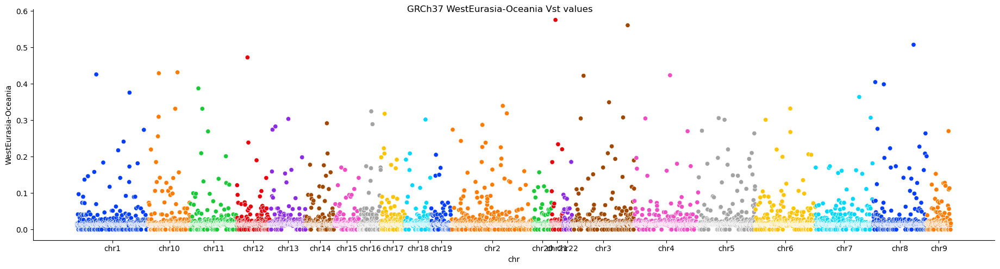

In [20]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation 

In [21]:
from stattools.resampling import PermutationTest
PermutationTest

stattools.resampling.permutation.PermutationTest

In [22]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


Starting permutation


,7-Gender,10-Region,11-Country,28,29,43,66,91,169,170,...,7723,7725,7731,7752,7753,7758,7762,7765,7766,7777
LP6005443-DNA_B06,F,WestEurasia,Iceland,2.0,2.0,2.0,0.0,2.0,2.0,2.0,...,2.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,2.0,2.0,0.0,0.0,2.0,2.0,2.0,...,0.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,1.0,2.0,0.0,...,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,2.0,0.0
LP6005442-DNA_G11,M,Africa,SierraLeone,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,0.0


In [63]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('10-Region')

dt_groupped = []
regions = features['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

,7-Gender,10-Region,11-Country,28,29,43,66,91,169,170,...,7723,7725,7731,7752,7753,7758,7762,7765,7766,7777
LP6005441-DNA_C01,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_C03,M,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,1.0,2.0,0.0,...,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_C10,M,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_D01,M,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0
LP6005441-DNA_D03,M,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
LP6005441-DNA_D10,F,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_E03,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_E05,M,SouthAsia,Pakistan,2.0,2.0,2.0,0.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0


In [64]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:46: RuntimeWarning: invalid value encountered in scalar divide
  vst = (vt-vs)/vt


In [65]:
pd.DataFrame(p_value_permutation)

,0,1,2,3,4,5,6,7,8,9,...,474,475,476,477,478,479,480,481,482,483
0,0.0004,0.0035,0.0136,0.0001,0.0051,0.0140,0.0002,0.4126,0.4855,0.0057,...,0.7329,0.0031,0.0003,0.1298,0.0001,0.1810,0.2192,0.0014,0.0001,0.8985
1,0.0001,0.9468,0.1316,0.0010,0.5262,0.2604,0.0107,0.0001,0.5237,0.5117,...,0.0733,0.0013,0.0012,0.2909,0.0265,0.0001,0.0315,0.0817,0.0011,0.5726
2,0.0001,0.3558,0.0004,0.0001,0.0001,0.0223,0.9406,0.0001,0.0009,0.0001,...,0.0001,0.5914,0.0001,0.0525,0.1112,0.7363,0.0411,0.6926,0.0001,0.0012
3,0.0001,0.4111,0.0001,0.0156,0.0896,0.9684,0.9342,0.1236,0.0001,0.0001,...,0.0922,0.0025,0.0087,0.0016,0.0159,0.9870,0.1033,0.0019,0.0001,0.4450
4,0.0001,0.0572,0.1153,0.0001,0.1570,0.0296,0.1459,0.0001,0.1099,0.0001,...,0.6049,0.0416,0.0481,0.1597,0.0168,0.0139,0.0646,0.0055,0.0433,0.8729
5,0.0016,1.0000,0.0001,0.0002,0.0001,0.3913,0.0250,0.4484,0.0001,0.9616,...,0.2259,0.0013,0.0773,0.0004,0.0001,0.0381,0.1593,0.0046,0.0014,0.6648
6,0.0001,0.0001,0.1267,0.0004,0.0061,0.0001,0.0058,0.0002,0.9601,0.0181,...,0.0270,0.2154,0.4833,0.5170,0.0001,0.0094,0.0001,0.0224,0.0182,0.7665
7,0.0001,0.0001,0.3702,1.0000,0.0011,0.0001,0.0001,0.0001,0.0007,0.0003,...,0.0001,0.0059,0.8628,0.0003,0.0001,0.2385,0.0006,0.0001,0.3246,0.0014
8,0.0001,0.0084,0.1405,0.0001,0.0115,0.0007,0.0001,0.5293,0.3199,0.0006,...,0.1695,0.4439,0.1007,0.1912,0.0001,0.0535,0.0011,0.5001,0.1821,0.2979
9,0.0001,0.0446,0.1312,0.0089,0.1000,0.0001,0.0008,0.0012,0.7355,0.0015,...,0.3369,0.2437,0.0542,0.9871,0.0001,0.4163,0.0002,0.5254,0.0055,0.9976


In [66]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_cnvr_grch37.csv')
permutation_pased__vst_chm13

,0,1,2,3,4,5,6,7,8,9,...,474,475,476,477,478,479,480,481,482,483
WestEurasia-SouthAsia,0.0004,0.0035,0.0136,0.0001,0.0051,0.0140,0.0002,0.4126,0.4855,0.0057,...,0.7329,0.0031,0.0003,0.1298,0.0001,0.1810,0.2192,0.0014,0.0001,0.8985
WestEurasia-Africa,0.0001,0.9468,0.1316,0.0010,0.5262,0.2604,0.0107,0.0001,0.5237,0.5117,...,0.0733,0.0013,0.0012,0.2909,0.0265,0.0001,0.0315,0.0817,0.0011,0.5726
WestEurasia-CentralAsiaSiberia,0.0001,0.3558,0.0004,0.0001,0.0001,0.0223,0.9406,0.0001,0.0009,0.0001,...,0.0001,0.5914,0.0001,0.0525,0.1112,0.7363,0.0411,0.6926,0.0001,0.0012
WestEurasia-Oceania,0.0001,0.4111,0.0001,0.0156,0.0896,0.9684,0.9342,0.1236,0.0001,0.0001,...,0.0922,0.0025,0.0087,0.0016,0.0159,0.9870,0.1033,0.0019,0.0001,0.4450
WestEurasia-America,0.0001,0.0572,0.1153,0.0001,0.1570,0.0296,0.1459,0.0001,0.1099,0.0001,...,0.6049,0.0416,0.0481,0.1597,0.0168,0.0139,0.0646,0.0055,0.0433,0.8729
WestEurasia-EastAsia,0.0016,1.0000,0.0001,0.0002,0.0001,0.3913,0.0250,0.4484,0.0001,0.9616,...,0.2259,0.0013,0.0773,0.0004,0.0001,0.0381,0.1593,0.0046,0.0014,0.6648
SouthAsia-Africa,0.0001,0.0001,0.1267,0.0004,0.0061,0.0001,0.0058,0.0002,0.9601,0.0181,...,0.0270,0.2154,0.4833,0.5170,0.0001,0.0094,0.0001,0.0224,0.0182,0.7665
SouthAsia-CentralAsiaSiberia,0.0001,0.0001,0.3702,1.0000,0.0011,0.0001,0.0001,0.0001,0.0007,0.0003,...,0.0001,0.0059,0.8628,0.0003,0.0001,0.2385,0.0006,0.0001,0.3246,0.0014
SouthAsia-Oceania,0.0001,0.0084,0.1405,0.0001,0.0115,0.0007,0.0001,0.5293,0.3199,0.0006,...,0.1695,0.4439,0.1007,0.1912,0.0001,0.0535,0.0011,0.5001,0.1821,0.2979
SouthAsia-America,0.0001,0.0446,0.1312,0.0089,0.1000,0.0001,0.0008,0.0012,0.7355,0.0015,...,0.3369,0.2437,0.0542,0.9871,0.0001,0.4163,0.0002,0.5254,0.0055,0.9976


<h2> Just CNvs that passed permutation 

In [23]:
permutation_pased__vst_chm13 = pd.read_csv('../data/permutation_passed_vst_cnvr_grch37.csv', index_col=0)
permutation_pased__vst_chm13

,0,1,2,3,4,5,6,7,8,9,...,474,475,476,477,478,479,480,481,482,483
WestEurasia-SouthAsia,0.0004,0.0035,0.0136,0.0001,0.0051,0.0140,0.0002,0.4126,0.4855,0.0057,...,0.7329,0.0031,0.0003,0.1298,0.0001,0.1810,0.2192,0.0014,0.0001,0.8985
WestEurasia-Africa,0.0001,0.9468,0.1316,0.0010,0.5262,0.2604,0.0107,0.0001,0.5237,0.5117,...,0.0733,0.0013,0.0012,0.2909,0.0265,0.0001,0.0315,0.0817,0.0011,0.5726
WestEurasia-CentralAsiaSiberia,0.0001,0.3558,0.0004,0.0001,0.0001,0.0223,0.9406,0.0001,0.0009,0.0001,...,0.0001,0.5914,0.0001,0.0525,0.1112,0.7363,0.0411,0.6926,0.0001,0.0012
WestEurasia-Oceania,0.0001,0.4111,0.0001,0.0156,0.0896,0.9684,0.9342,0.1236,0.0001,0.0001,...,0.0922,0.0025,0.0087,0.0016,0.0159,0.9870,0.1033,0.0019,0.0001,0.4450
WestEurasia-America,0.0001,0.0572,0.1153,0.0001,0.1570,0.0296,0.1459,0.0001,0.1099,0.0001,...,0.6049,0.0416,0.0481,0.1597,0.0168,0.0139,0.0646,0.0055,0.0433,0.8729
WestEurasia-EastAsia,0.0016,1.0000,0.0001,0.0002,0.0001,0.3913,0.0250,0.4484,0.0001,0.9616,...,0.2259,0.0013,0.0773,0.0004,0.0001,0.0381,0.1593,0.0046,0.0014,0.6648
SouthAsia-Africa,0.0001,0.0001,0.1267,0.0004,0.0061,0.0001,0.0058,0.0002,0.9601,0.0181,...,0.0270,0.2154,0.4833,0.5170,0.0001,0.0094,0.0001,0.0224,0.0182,0.7665
SouthAsia-CentralAsiaSiberia,0.0001,0.0001,0.3702,1.0000,0.0011,0.0001,0.0001,0.0001,0.0007,0.0003,...,0.0001,0.0059,0.8628,0.0003,0.0001,0.2385,0.0006,0.0001,0.3246,0.0014
SouthAsia-Oceania,0.0001,0.0084,0.1405,0.0001,0.0115,0.0007,0.0001,0.5293,0.3199,0.0006,...,0.1695,0.4439,0.1007,0.1912,0.0001,0.0535,0.0011,0.5001,0.1821,0.2979
SouthAsia-America,0.0001,0.0446,0.1312,0.0089,0.1000,0.0001,0.0008,0.0012,0.7355,0.0015,...,0.3369,0.2437,0.0542,0.9871,0.0001,0.4163,0.0002,0.5254,0.0055,0.9976


In [37]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end','index', 'i'])
vst_dt_sb

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,0.00000,0.00000,0.24275,0.00000,0.39679,0.00000,0.00000,0.21137,0.00000,0.35829,...,0.21811,0.00000,0.36688,0.00000,0.18174,0.04652,0.22051,0.31818,0.00000,0.36991
1,0.07934,0.01894,0.02107,0.01156,0.26108,0.03647,0.11471,0.03761,0.05564,0.07819,...,0.06065,0.04167,0.32616,0.06675,0.02424,0.17665,0.01688,0.21544,0.02702,0.13372
2,0.00908,0.09647,0.14614,0.03920,0.03730,0.13347,0.11400,0.19402,0.04916,0.05526,...,0.02901,0.23709,0.02787,0.01512,0.38022,0.07994,0.01761,0.17174,0.29115,0.04471
3,0.01836,0.16983,0.03169,0.13719,0.13446,0.01801,0.14586,0.01961,0.25752,0.13846,...,0.11813,0.65554,0.02273,0.28063,0.33654,0.13178,0.07743,0.65278,0.10418,0.24008
4,0.01667,0.02970,0.02526,0.02430,0.09932,0.00886,0.06848,0.05914,0.05693,0.06431,...,0.00000,0.00000,0.21212,0.04373,0.00000,0.18816,0.03851,0.18182,0.03731,0.09557
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,0.05058,0.21085,0.05822,0.27048,0.11034,0.25829,0.08441,0.01533,0.12106,0.02890,...,0.07310,0.01716,0.03814,0.01577,0.11414,0.03030,0.10177,0.06667,0.01453,0.05794
480,0.00895,0.01012,0.01001,0.05698,0.18511,0.00874,0.01329,0.01515,0.06872,0.20869,...,0.01519,0.07754,0.21765,0.01414,0.06616,0.19437,0.01409,0.06643,0.05243,0.17171
481,0.03449,0.07587,0.04312,0.04299,0.06434,0.04557,0.19732,0.01666,0.14672,0.02866,...,0.22406,0.01808,0.27607,0.22053,0.18554,0.02633,0.01377,0.24813,0.16119,0.02107
482,0.01956,0.14774,0.01467,0.11358,0.06603,0.02223,0.25922,0.04629,0.08199,0.14625,...,0.13338,0.55406,0.03173,0.09779,0.21156,0.06586,0.01545,0.41705,0.22582,0.04053


In [44]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(True, np.NaN)
passed_permut = passed_permut.replace(False, 0)
passed_permut

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,0.0
4,NaN,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,0.0,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0
480,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
481,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0
482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0


In [45]:
d = passed_permut[passed_permut.isnull()] = vst_dt_sb
d

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,0.00000,0.00000,0.24275,0.00000,0.39679,0.00000,0.00000,0.21137,0.00000,0.35829,...,0.21811,0.00000,0.36688,0.00000,0.18174,0.04652,0.22051,0.31818,0.00000,0.36991
1,0.07934,0.01894,0.02107,0.01156,0.26108,0.03647,0.11471,0.03761,0.05564,0.07819,...,0.06065,0.04167,0.32616,0.06675,0.02424,0.17665,0.01688,0.21544,0.02702,0.13372
2,0.00908,0.09647,0.14614,0.03920,0.03730,0.13347,0.11400,0.19402,0.04916,0.05526,...,0.02901,0.23709,0.02787,0.01512,0.38022,0.07994,0.01761,0.17174,0.29115,0.04471
3,0.01836,0.16983,0.03169,0.13719,0.13446,0.01801,0.14586,0.01961,0.25752,0.13846,...,0.11813,0.65554,0.02273,0.28063,0.33654,0.13178,0.07743,0.65278,0.10418,0.24008
4,0.01667,0.02970,0.02526,0.02430,0.09932,0.00886,0.06848,0.05914,0.05693,0.06431,...,0.00000,0.00000,0.21212,0.04373,0.00000,0.18816,0.03851,0.18182,0.03731,0.09557
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,0.05058,0.21085,0.05822,0.27048,0.11034,0.25829,0.08441,0.01533,0.12106,0.02890,...,0.07310,0.01716,0.03814,0.01577,0.11414,0.03030,0.10177,0.06667,0.01453,0.05794
480,0.00895,0.01012,0.01001,0.05698,0.18511,0.00874,0.01329,0.01515,0.06872,0.20869,...,0.01519,0.07754,0.21765,0.01414,0.06616,0.19437,0.01409,0.06643,0.05243,0.17171
481,0.03449,0.07587,0.04312,0.04299,0.06434,0.04557,0.19732,0.01666,0.14672,0.02866,...,0.22406,0.01808,0.27607,0.22053,0.18554,0.02633,0.01377,0.24813,0.16119,0.02107
482,0.01956,0.14774,0.01467,0.11358,0.06603,0.02223,0.25922,0.04629,0.08199,0.14625,...,0.13338,0.55406,0.03173,0.09779,0.21156,0.06586,0.01545,0.41705,0.22582,0.04053


In [32]:
passed_permut.isnull()

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
1,True,False,False,False,False,False,True,True,True,True,...,False,False,True,False,True,True,False,False,False,False
2,True,False,True,True,False,True,False,False,False,False,...,True,True,False,True,False,True,False,True,False,True
3,True,True,True,True,True,True,True,False,True,True,...,True,False,False,False,True,True,True,False,True,False
4,True,False,True,False,False,True,True,True,True,False,...,False,False,False,False,False,True,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,False,True,False,False,True,True,True,False,False,False,...,True,True,True,False,False,True,True,True,True,False
480,False,True,True,False,False,False,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
481,True,False,False,True,True,True,True,True,False,False,...,True,True,False,False,True,True,True,False,False,False
482,True,True,True,True,True,True,True,False,False,True,...,True,False,False,False,True,True,True,True,False,False


In [46]:
a = passed_permut.fillna(vst_dt_filtered)
a

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0
2,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,0.0
4,NaN,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,0.0,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0
480,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
481,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0
482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,...,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0


In [ ]:
<h2> CNVs that passed permutation and vst  

In [41]:
vst_dt_sb = vst_dt.drop(columns=['chr', 'start','end'])
passed_permut = (permutation_pased__vst_chm13 <=0.05)
passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut 

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
1,True,NaN,NaN,NaN,NaN,NaN,True,True,True,True,...,NaN,NaN,True,NaN,True,True,NaN,NaN,NaN,NaN
2,True,NaN,True,True,NaN,True,NaN,NaN,NaN,NaN,...,True,True,NaN,True,NaN,True,NaN,True,NaN,True
3,True,True,True,True,True,True,True,NaN,True,True,...,True,NaN,NaN,NaN,True,True,True,NaN,True,NaN
4,True,NaN,True,NaN,NaN,True,True,True,True,NaN,...,NaN,NaN,NaN,NaN,NaN,True,True,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,NaN,True,NaN,NaN,True,True,True,NaN,NaN,NaN,...,True,True,True,NaN,NaN,True,True,True,True,NaN
480,NaN,True,True,NaN,NaN,NaN,True,True,True,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
481,True,NaN,NaN,True,True,True,True,True,NaN,NaN,...,True,True,NaN,NaN,True,True,True,NaN,NaN,NaN
482,True,True,True,True,True,True,True,NaN,NaN,True,...,True,NaN,NaN,NaN,True,True,True,True,NaN,NaN


In [42]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [43]:
passed_permut

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h1> Saving CNVs that passed permutation and Vst 

In [117]:
cnv_passed_vst = cnv.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst.fillna(2)
cnv_passed_vst['Chromosome'] = 'chr' + cnv_passed_vst['Chromosome'].astype(str)
cnv_passed_vst['Start'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst['End'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv_passed_vst.iloc[:,0:3]
coordinates.to_csv('../data/grch37_candidates_cnvr_coordinates.bed', sep='\t', header=False, index=False)

<h1> Deletions PCA

In [36]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,28,29,43,66,91,169,170,171,202,211,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [37]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,28,29,43,66,91,169,170,171,202,211,...,7713,7723,7725,7752,7753,7758,7762,7765,7766,7777
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,1.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
LP6005441-DNA_A08,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,1.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [38]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [39]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.397371,-4.880800,4.853884,0.615047,-0.523402,-1.743970,0.109423,1.552097,0.631074,0.014203
LP6005441-DNA_A04,F,America,Colombia,-4.092935,-2.320603,-5.759670,5.842585,1.871562,-3.007227,0.102433,1.973603,3.105924,0.945655
LP6005441-DNA_A05,M,WestEurasia,France,-0.147293,6.172520,0.133662,1.097528,0.426550,-1.830050,-0.585507,-1.070984,2.156652,0.754328
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),0.149958,5.039153,0.811002,-0.121364,-0.469847,-2.307647,-1.426769,1.156300,-0.932334,-0.349242
LP6005441-DNA_A08,M,Africa,Congo,10.963544,-2.470812,-2.068657,-0.672016,1.238773,0.170487,-1.789893,0.224351,1.773564,1.000384
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-3.327523,-1.901169,-4.192993,7.491278,0.074804,-2.204844,-0.260660,-1.043647,2.444176,-0.543627
SS6004477,M,Oceania,Australia,1.019966,-5.745655,9.813149,2.687426,0.257214,-1.982144,-0.723109,1.191839,0.189757,1.062819
SS6004478,U,Oceania,Australia,-0.278386,-5.024362,7.490911,2.919735,-0.976773,-0.895730,0.782427,-0.443094,0.997999,0.271480
SS6004479,F,America,Mexico,-4.791348,-2.360441,-5.703390,7.526688,-0.777997,0.379261,0.831026,4.756568,1.397020,-1.369847


In [40]:
pca.explained_variance_ratio_

array([0.07502179, 0.05207715, 0.03668483, 0.02372345, 0.01176251,
       0.01096257, 0.01016962, 0.01007563, 0.00973013, 0.00965534])

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

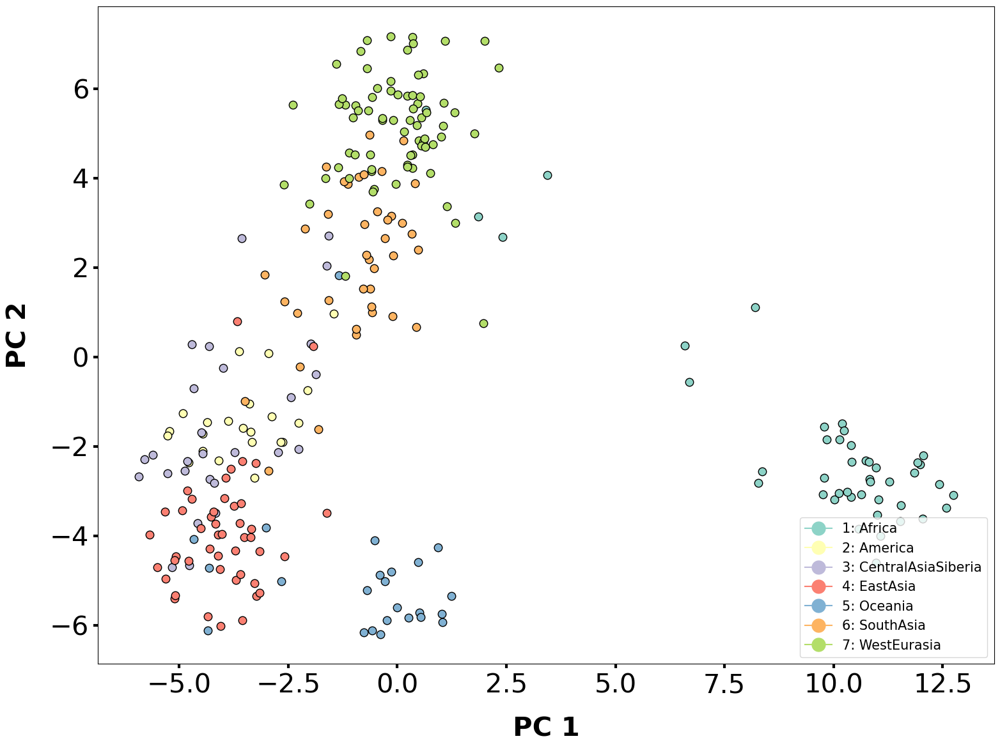

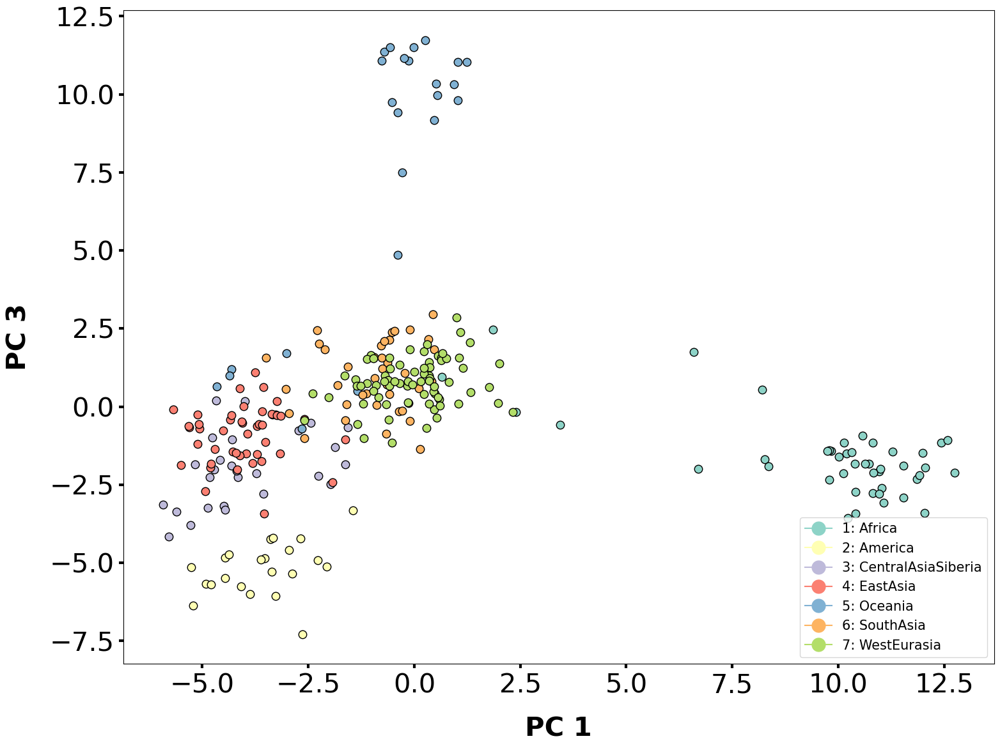

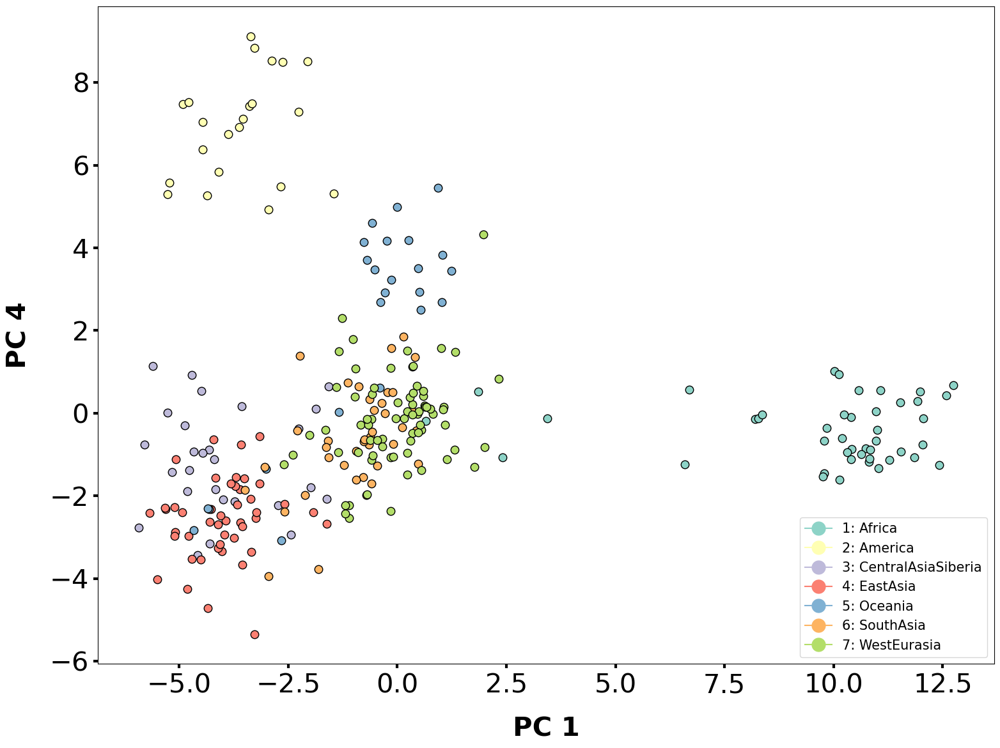

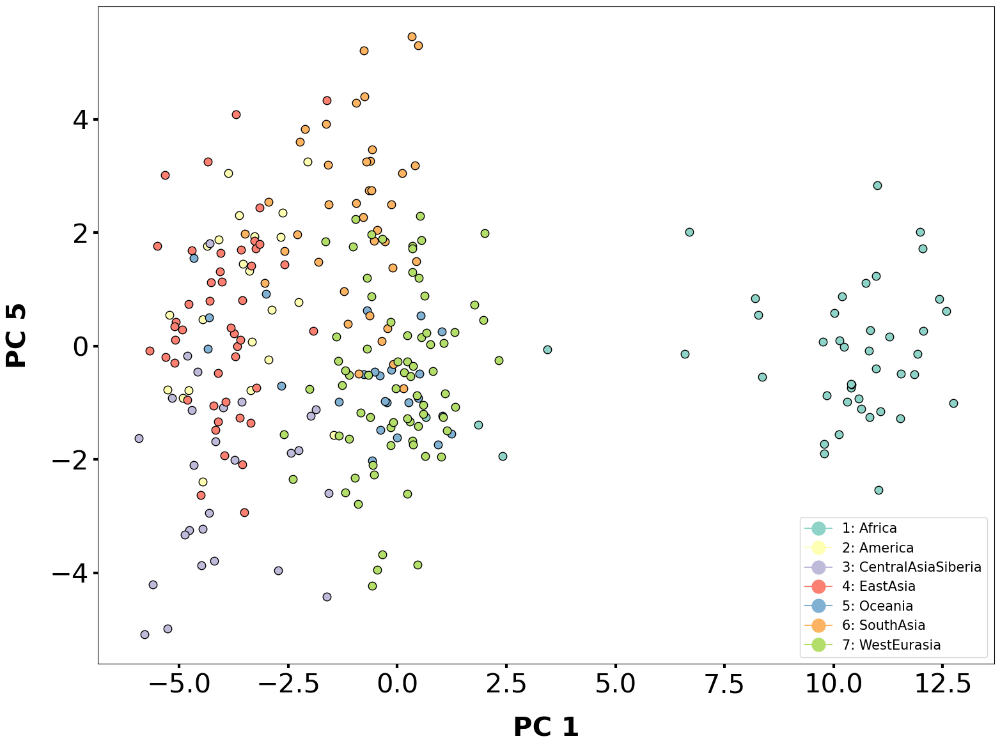

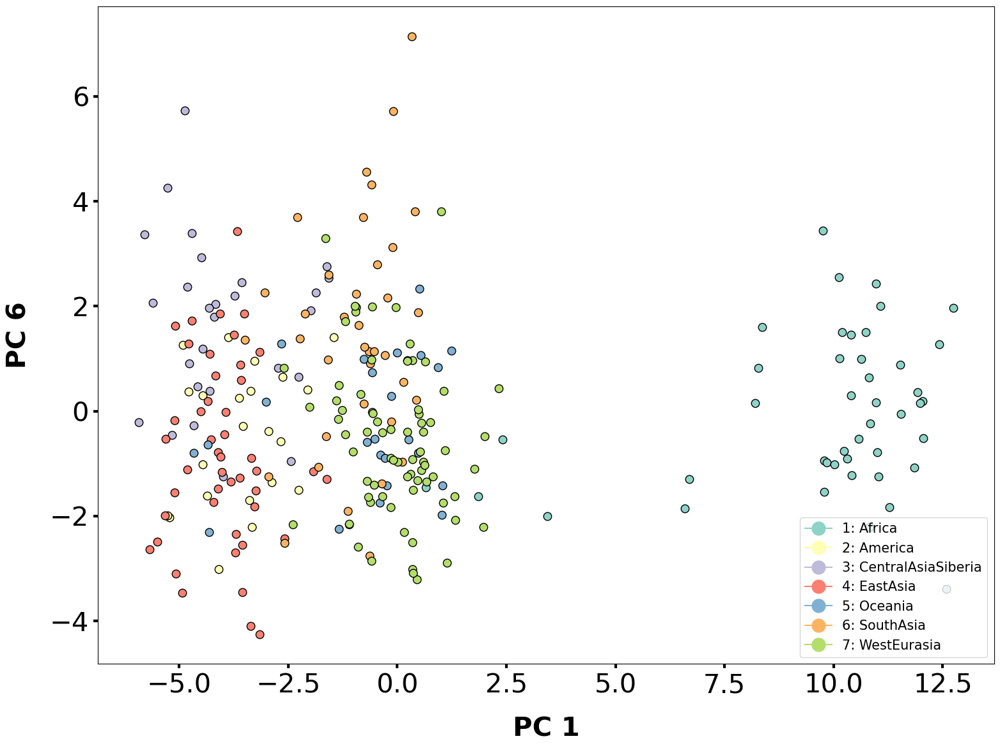

...

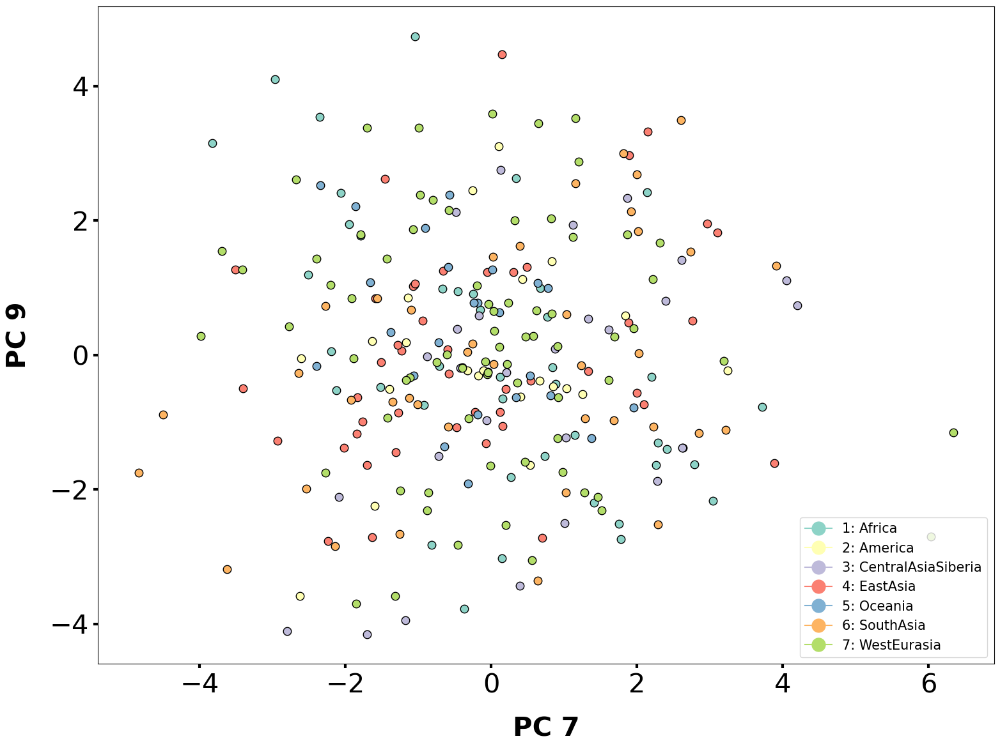

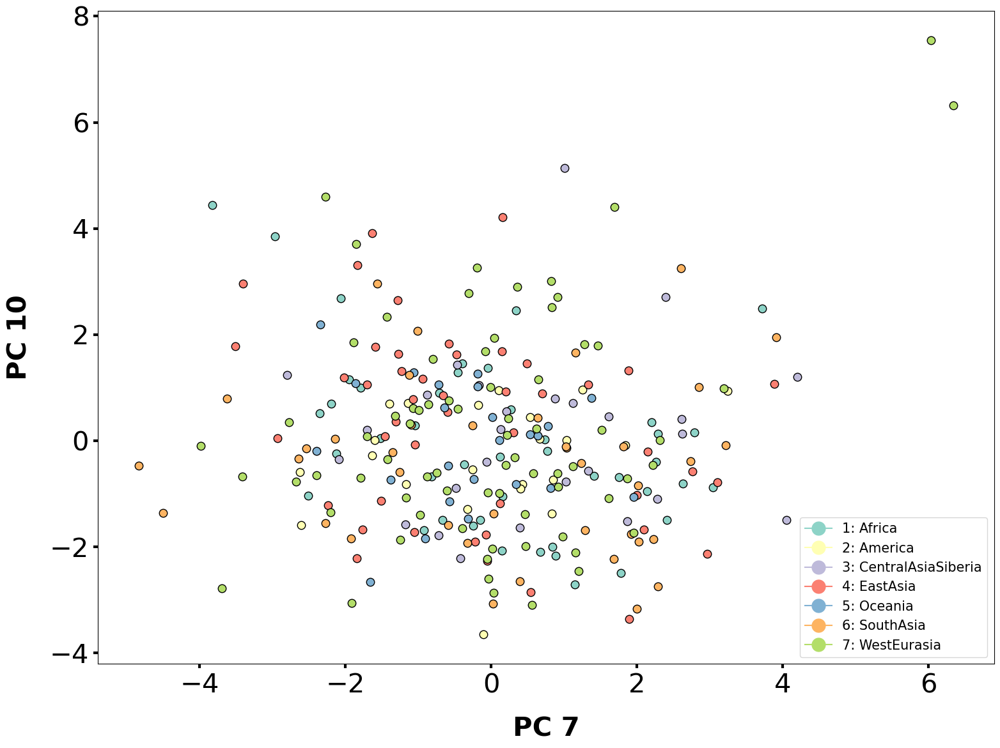

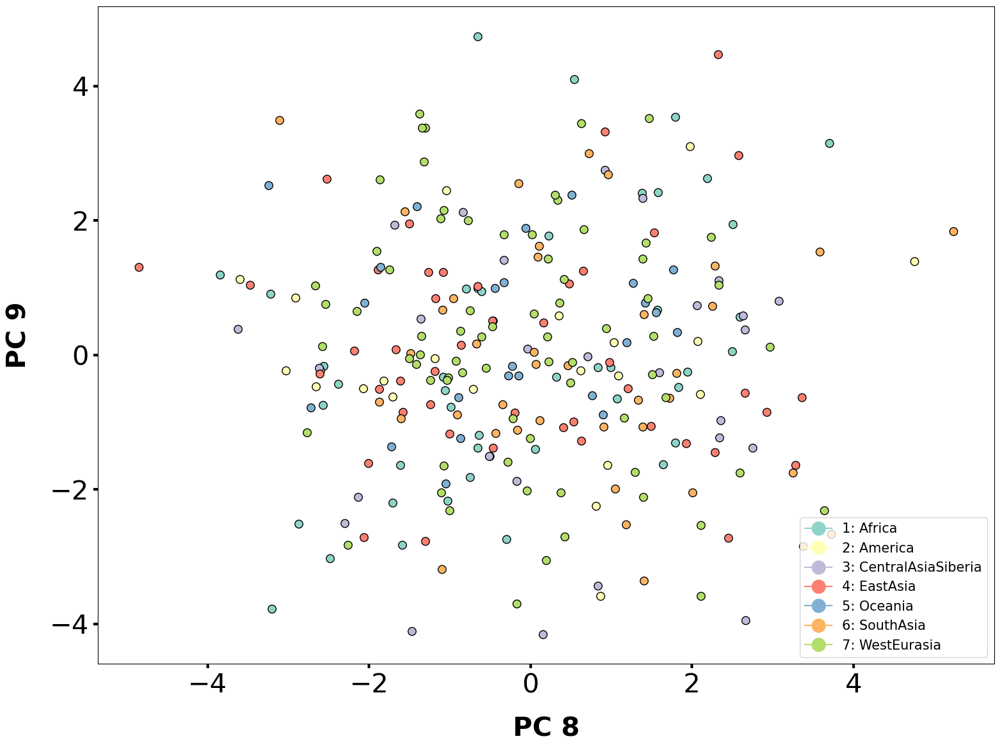

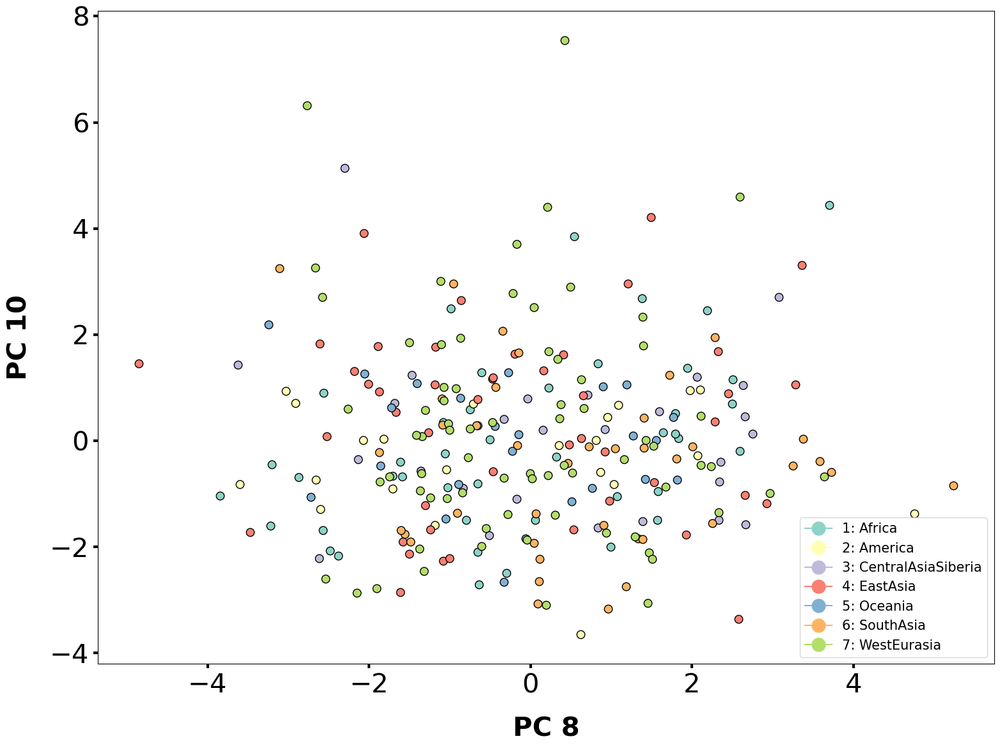

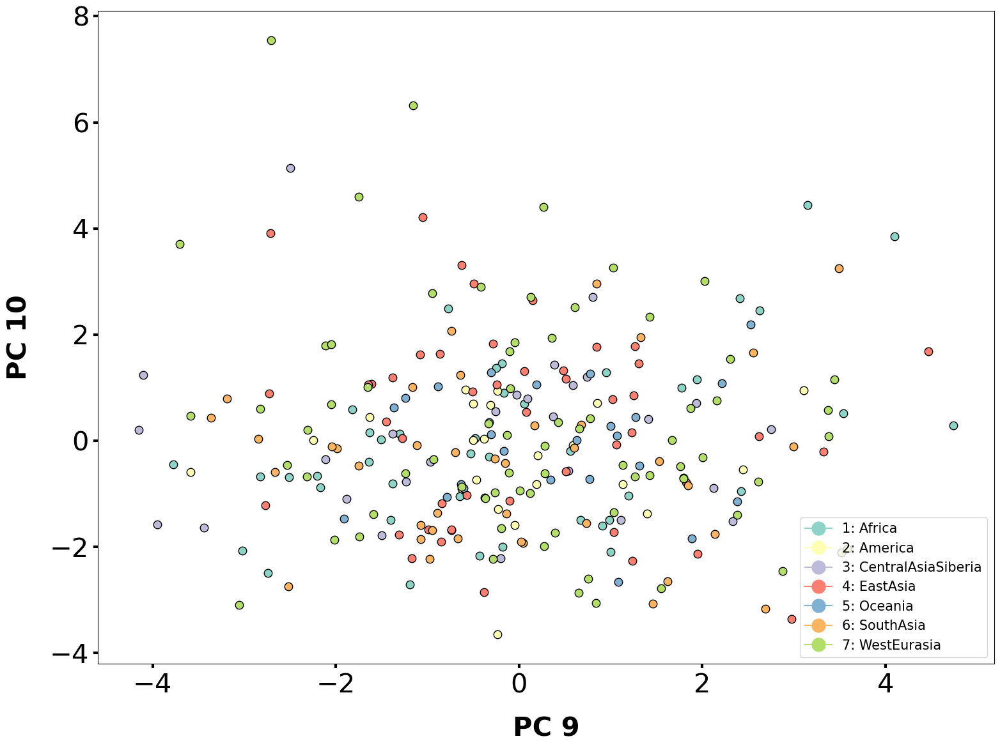

In [41]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

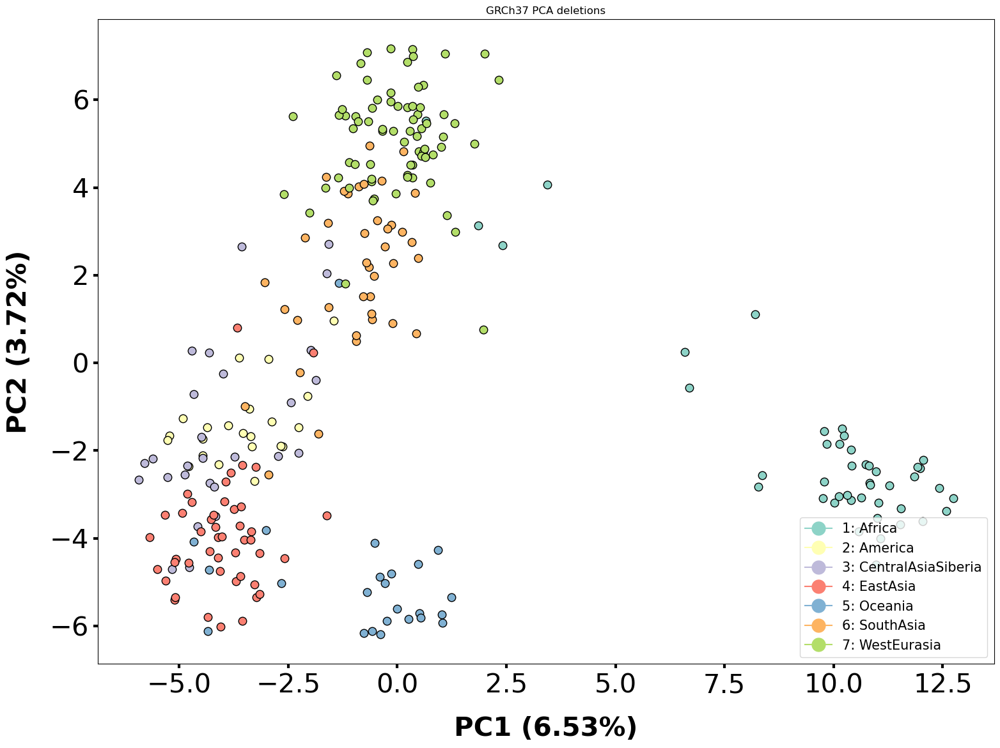

In [42]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender      11-Country  component_1  component_2  component_3  \
10-Region                                                                     
Oceania            F  PapuaNewGuinea    -0.397371    -4.880800     4.853884   
America            F        Colombia    -4.092935    -2.320603    -5.759670   
WestEurasia        M          France    -0.147293     6.172520     0.133662   
WestEurasia        M  Italy(Bergamo)     0.149958     5.039153     0.811002   
Africa             M           Congo    10.963544    -2.470812    -2.068657   
...              ...             ...          ...          ...          ...   
America            M          Brazil    -3.327523    -1.901169    -4.192993   
Oceania            M       Australia     1.019966    -5.745655     9.813149   
Oceania            U       Australia    -0.278386    -5.024362     7.490911   
America            F          Mexico    -4.791348    -2.360441    -5.703390   
Africa             M           Sudan     9.746926   

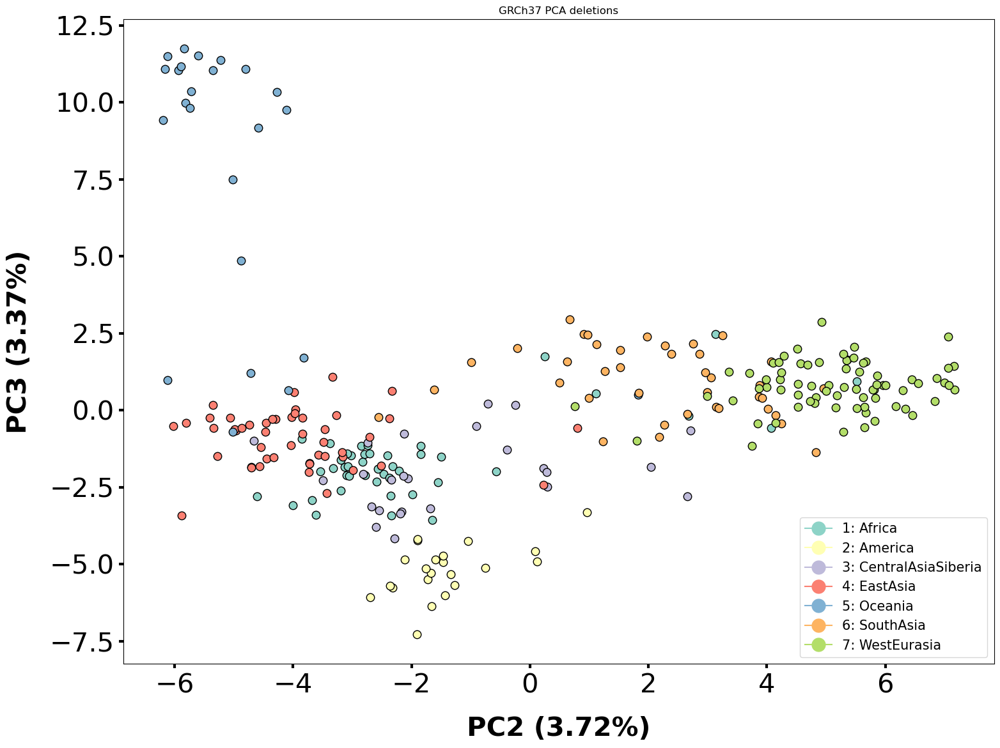

In [43]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

<h1> Duplications

In [48]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


,346,4963
Sample_ID,,
LP6005441-DNA_A03,2.166667,3.0
LP6005441-DNA_A04,2.500000,4.0
LP6005441-DNA_A05,1.833333,5.0
LP6005441-DNA_A06,1.833333,4.0
LP6005441-DNA_A08,1.846154,3.0
...,...,...
SS6004476,1.888889,4.0
SS6004477,2.333333,4.0
SS6004478,2.500000,4.0


In [49]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
LP6005441-DNA_A08,M,Africa,Congo
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [53]:
#PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,1.027247,0.065404
LP6005441-DNA_A04,F,America,Colombia,0.046035,0.450548
LP6005441-DNA_A05,M,WestEurasia,France,-0.987442,-0.162942
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),0.011191,-0.215208
LP6005441-DNA_A08,M,Africa,Congo,1.010495,-0.254671
...,...,...,...,...,...
SS6004476,M,America,Brazil,0.014095,-0.159728
SS6004477,M,Oceania,Australia,0.037324,0.284109
SS6004478,U,Oceania,Australia,0.046035,0.450548
SS6004479,F,America,Mexico,0.034836,0.236555


            7-Gender      11-Country  component_1  component_2
10-Region                                                     
Oceania            F  PapuaNewGuinea     1.027247     0.065404
America            F        Colombia     0.046035     0.450548
WestEurasia        M          France    -0.987442    -0.162942
WestEurasia        M  Italy(Bergamo)     0.011191    -0.215208
Africa             M           Congo     1.010495    -0.254671
...              ...             ...          ...          ...
America            M          Brazil     0.014095    -0.159728
Oceania            M       Australia     0.037324     0.284109
Oceania            U       Australia     0.046035     0.450548
America            F          Mexico     0.034836     0.236555
Africa             M           Sudan     0.019902    -0.048769

[275 rows x 4 columns]
Count of groups by factor: 7
            7-Gender      11-Country  component_1  component_2
10-Region                                                     
Oc

KeyError: 'component_3'

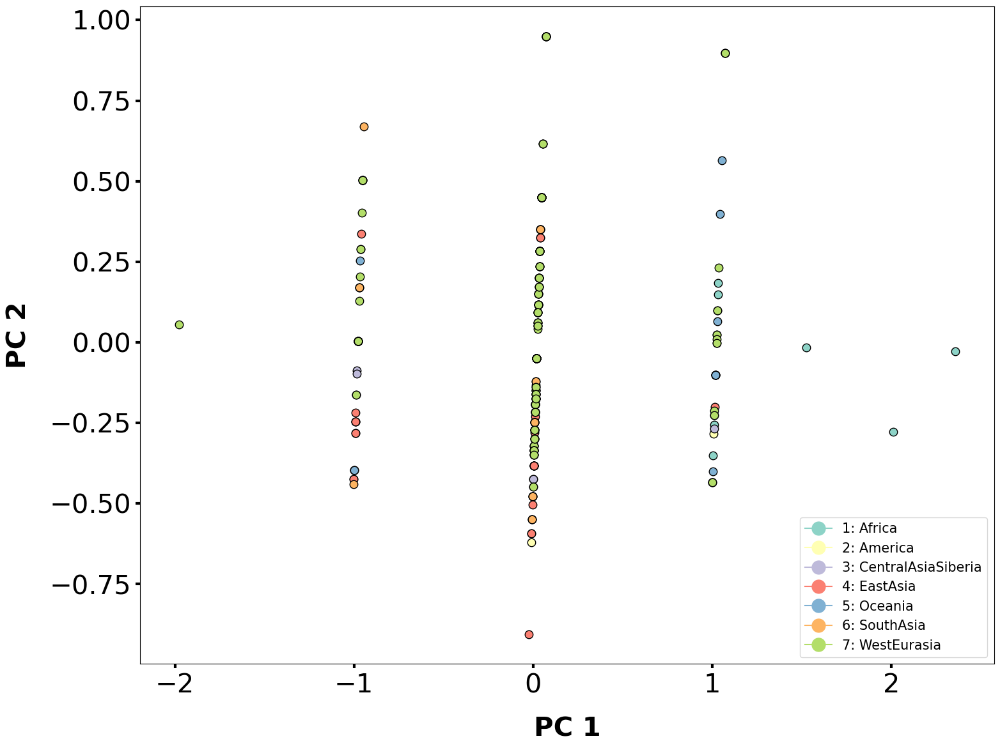

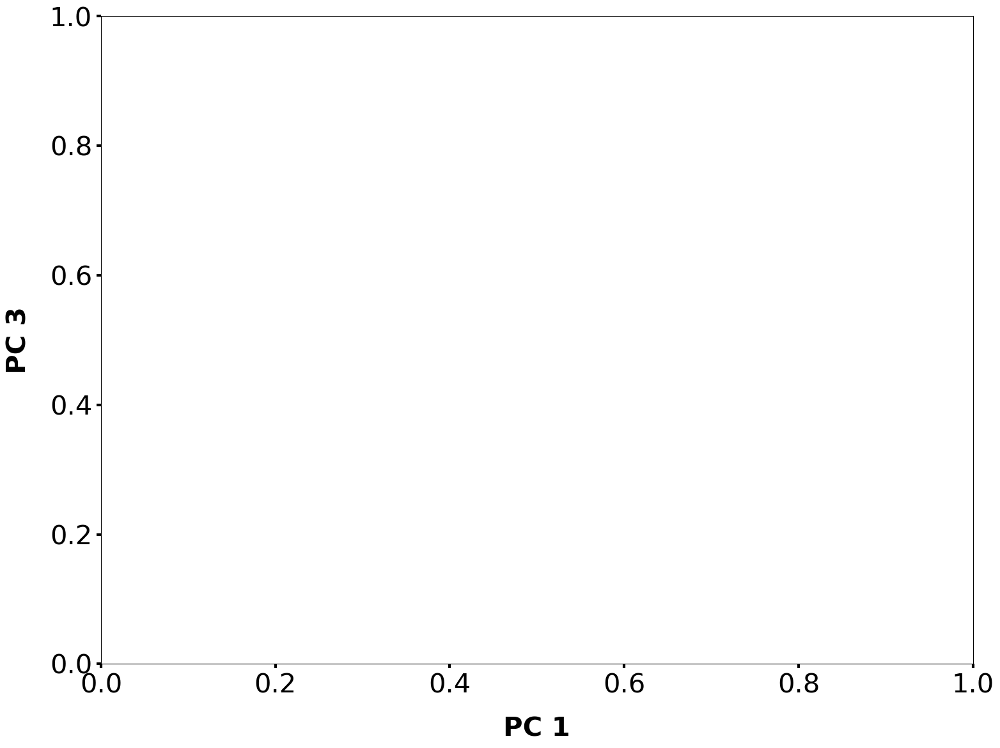

In [54]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [55]:
pca.explained_variance_ratio_

array([0.75298919, 0.24701081])

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)